# EDA (All Zipcodes):

Here we will load the saved dataframes and added each one into a list. We will then visualize the data, looking for trends, seasonality, and residuals using Seasonal_Decomposition. We will also look at the ACF and PACF Curves. This will display graphs for all zipcodes. 

# Importing Libraries

We will use the following libraries for this project:

In [3]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LassoLarsCV
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")
import time

# Loading Zillow Data

In [4]:
df = pd.read_csv('zillow_data.csv')

# Defining list of dataframes for each state.
states = df['State'].unique()
state_df = []
for state in states:
    state_df.append(df[df['State']==state].copy())

# Defining dataframe for Houston zipcodes 
houston = state_df[1][state_df[1]['City'] == 'Houston'].copy()
houston.set_index(keys='RegionName',inplace=True)

# Creating dataframe of zipcodes by average price and viewing top three
houston_zips_by_mean = pd.DataFrame(houston.iloc[:, 6:-1].mean(axis=1), columns=['Mean'])
houston_zips = houston_zips_by_mean.index 

# Exploring Data

In [5]:
loaded_houston_dfs = []
for o in houston_zips:
    loaded_zip = pd.read_csv(f'{o}.csv')
    loaded_houston_dfs.append(loaded_zip)

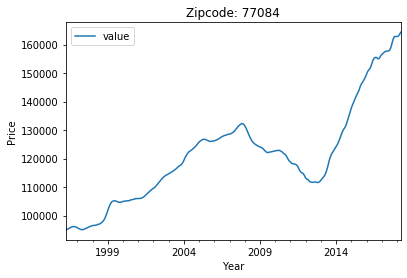

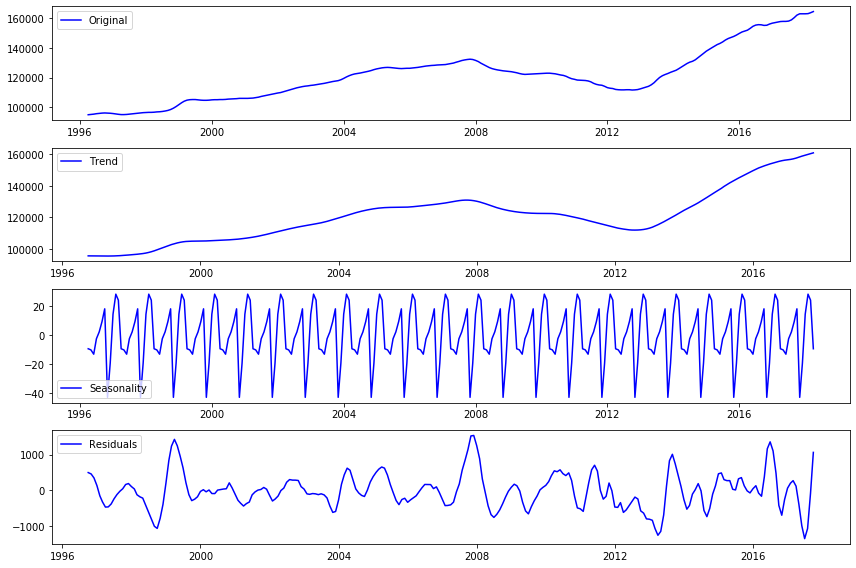

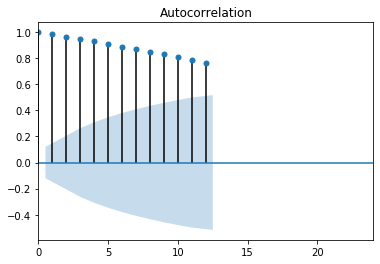

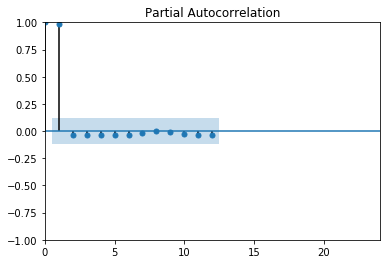

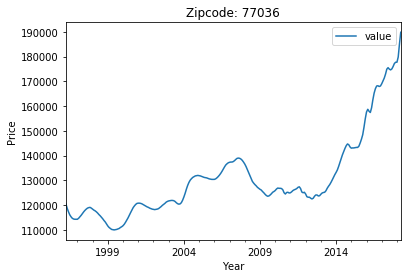

...

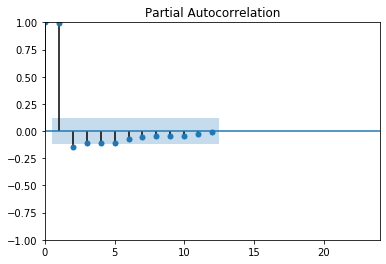

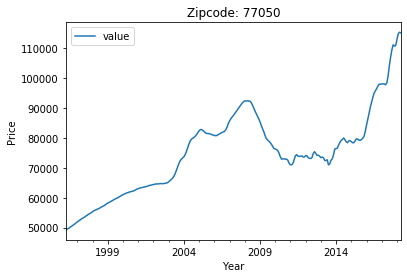

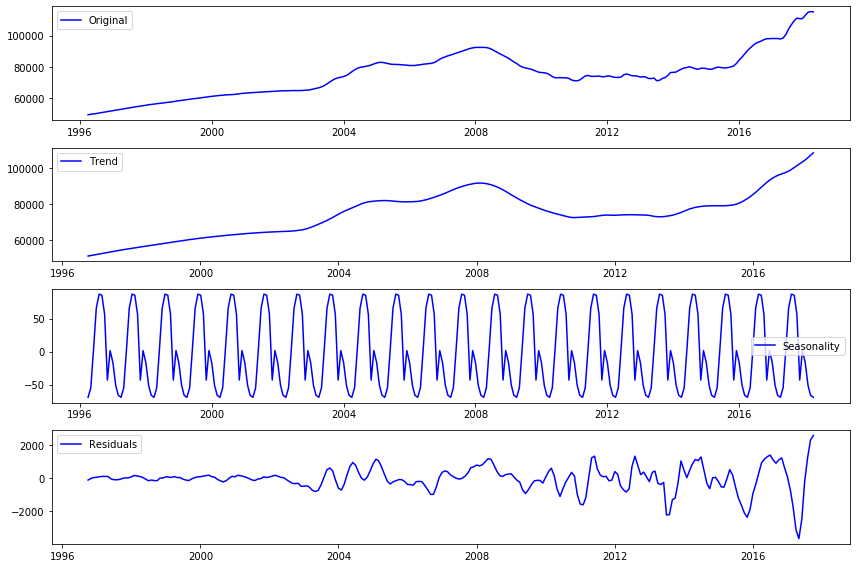

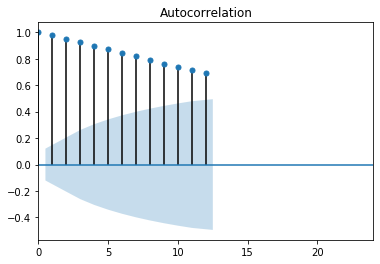

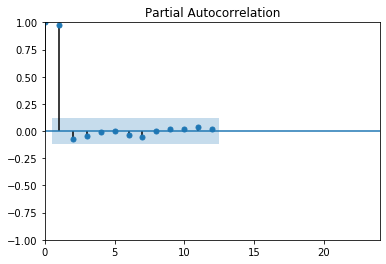

In [10]:
for z,i in zip(loaded_houston_dfs,houston_zips):
    z.index = pd.to_datetime(z.variable,format="%Y-%m")
    z.drop('variable',axis=1,inplace=True)
    z.plot()
    plt.title('Zipcode: {}'.format(i))
    plt.xlabel('Year')
    plt.ylabel('Price')
    plt.show();

    # Applying seasonal_decompose()
    decomposition = seasonal_decompose(z)
    
    # Gathering the trend, seasonality, and residuals 
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid
    
    # Plotting gathered statistics
    plt.figure(figsize=(12,8))
    plt.subplot(411)
    plt.plot(z, label='Original', color='blue')
    plt.legend(loc='best')
    plt.subplot(412)
    plt.plot(trend, label='Trend', color='blue')
    plt.legend(loc='best')
    plt.subplot(413)
    plt.plot(seasonal,label='Seasonality', color='blue')
    plt.legend(loc='best')
    plt.subplot(414)
    plt.plot(residual, label='Residuals', color='blue')
    plt.legend(loc='best')
    plt.tight_layout()

    # Plotting ACF and PACF Curves
    plot_acf(z, lags=12); plt.xlim(0,24); plt.show()
    plot_pacf(z,lags=12); plt.xlim(0,24); plt.ylim(-1,1);plt.show()